In [16]:
from zs6d import ZS6D
import os
import json


# Loading the config file:
with open(os.path.join("./zs6d_configs/bop_eval_configs/cfg_ycbv_inference_bop.json"), "r") as f:
    config = json.load(f)
    
# Instantiating the pose estimator:
# This involves handing over the path to the templates_gt file and the corresponding object norm_factors.
pose_estimator = ZS6D(config['templates_gt_path'], config['norm_factor_path'])

Using cache found in C:\Users\nidul/.cache\torch\hub\facebookresearch_dino_main
100%|██████████| 21/21 [04:58<00:00, 14.23s/it]


In [17]:
import cv2
from PIL import Image
import pose_utils.img_utils as img_utils
import pose_utils.vis_utils as vis_utils
import numpy as np
import time
import matplotlib.pyplot as plt

# Loading a ground truth file to access segmentation masks to test zs6d:
with open(os.path.join(config['gt_path']), 'r') as f:
    data_gt = json.load(f)
    
print(data_gt)

{'000056_1': [{'scene_id': '000056', 'obj_id': 1, 'bbox_obj': [138, 165, 134, 211], 'bbox_visib': [138, 165, 134, 211], 'img_name': './test/000056/rgb/000001.png', 'cam_R_m2c': [0.25344259862252894, 0.967062444907854, 0.023598126881120306, 0.3379252561470427, -0.06565103180890929, -0.9388805087260805, -0.9064072681266561, 0.24592676377433598, -0.34343354111832913], 'cam_t_m2c': [-83.37310979913636, 21.041325702374337, 837.3672823741553], 'px_count_all': 25994, 'px_count_valid': 19961, 'px_count_visib': 22319, 'visib_fract': 0.8586212202816035, 'cam_K': [1066.778, 0.0, 312.9869, 0.0, 1067.487, 241.3109, 0.0, 0.0, 1.0], 'depth_scale': 0.1, 'model_path': './models/obj_000001.ply', 'model_info': {'diameter': 172.063, 'min_x': -51.1445, 'min_y': -51.223, 'min_z': -70.072, 'size_x': 102.289, 'size_y': 102.446, 'size_z': 140.144, 'symmetries_discrete': [[-1, -4.31991e-14, 0, 0, 4.31991e-14, -1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]]}, 'sam_score': 0.7587944865226746, 'mask_sam': {'counts': [64985, 6,

running k-means on cuda..


[running kmeans]: 5it [00:00, 25.28it/s, center_shift=0.000000, iteration=5, tol=0.000100]


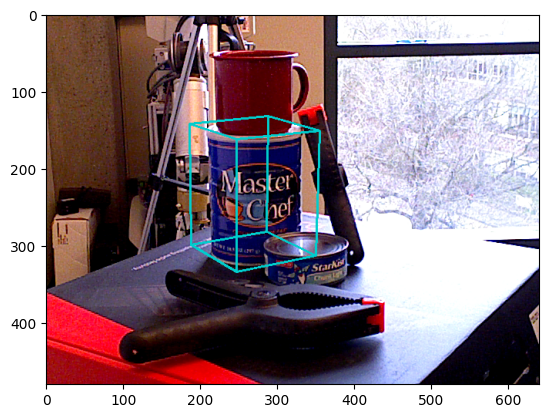

Pose estimation time: 2.0898194313049316
R_est: [[-0.83118327  0.55571289  0.0178201 ]
 [ 0.13230868  0.22882156 -0.96443512]
 [-0.54002665 -0.79926459 -0.26371829]]
t_est: [-37.43777062 -11.07853542 906.2944302 ]
running k-means on cuda..


[running kmeans]: 9it [00:00, 24.18it/s, center_shift=0.000000, iteration=9, tol=0.000100]


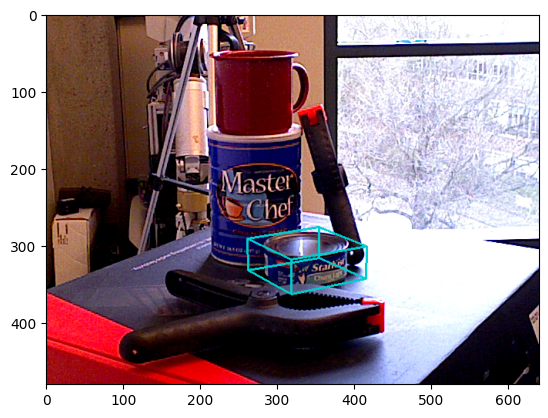

Pose estimation time: 6.562453746795654
R_est: [[-0.86053834  0.50936388 -0.00471264]
 [ 0.11436889  0.18418712 -0.97621456]
 [-0.49638043 -0.84060903 -0.21675546]]
t_est: [ 18.84927398  58.03063015 815.57279762]
running k-means on cuda..


[running kmeans]: 7it [00:00, 24.96it/s, center_shift=0.000000, iteration=7, tol=0.000100]


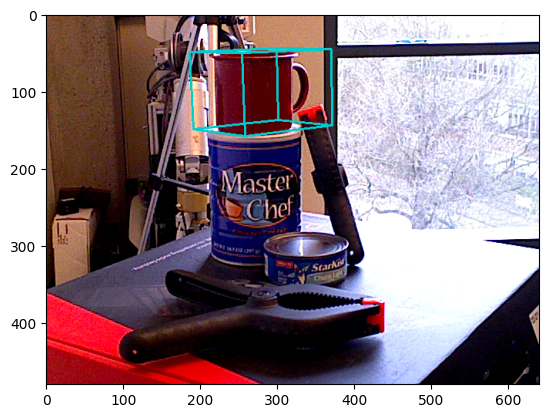

Pose estimation time: 14.415963888168335
R_est: [[ 0.77476742 -0.63176999 -0.02453828]
 [-0.14697546 -0.14222297 -0.97886201]
 [ 0.61492574  0.76199692 -0.20304441]]
t_est: [ -26.97124706 -117.77151099  876.3564041 ]
running k-means on cuda..


[running kmeans]: 1it [00:00, 146.99it/s, center_shift=0.000000, iteration=1, tol=0.000100]


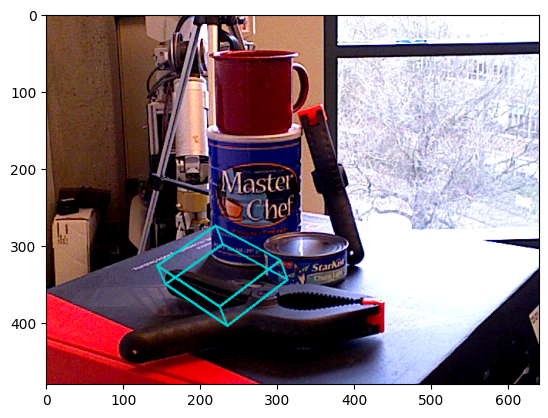

Pose estimation time: 1.3897805213928223
R_est: [[ 0.73102611 -0.63312114 -0.25447681]
 [-0.52266912 -0.27980736 -0.8053104 ]
 [ 0.43865455  0.7217101  -0.53545935]]
t_est: [-103.01792754  113.26434048 1282.97557078]
running k-means on cuda..


[running kmeans]: 1it [00:00, 199.81it/s, center_shift=0.000000, iteration=1, tol=0.000100]


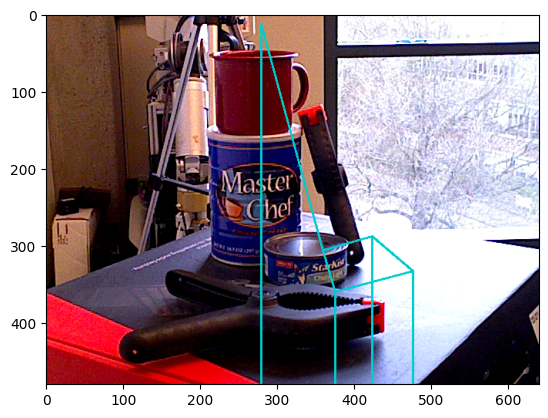

Pose estimation time: 6.670517683029175
R_est: [[-0.01577363  0.26103354  0.96520085]
 [ 0.02962886  0.96501906 -0.26050017]
 [-0.9994365   0.02448877 -0.02295598]]
t_est: [ 19.48952402 -45.59545189 473.18891257]


In [23]:
img_id = '000048_1'
# img_id = '8'



for i in range(len(data_gt[img_id])):
    obj_number = i
    obj_id = data_gt[img_id][obj_number]['obj_id']
    cam_K = np.array(data_gt[img_id][obj_number]['cam_K']).reshape((3,3))
    bbox = data_gt[img_id][obj_number]['bbox_visib']

    img_path = os.path.join(config['dataset_path'], data_gt[img_id][obj_number]['img_name'].split("./")[-1])
    img = Image.open(img_path)

    mask = data_gt[img_id][obj_number]['mask_sam']
    mask = img_utils.rle_to_mask(mask)
    mask = mask.astype(np.uint8)

    start_time = time.time()
    
    # To estimate the objects Rotation R and translation t the input image, the object_id, a segmentation mask and camera matrix are necessary
    R_est, t_est = pose_estimator.get_pose(img, str(obj_id), mask, cam_K, bbox=None)

    end_time = time.time()
    
    out_img = vis_utils.draw_3D_bbox_on_image(np.array(img), R_est, t_est, cam_K, data_gt[img_id][obj_number]['model_info'], factor=1.0)

    plt.imshow(out_img)
    plt.show()
    print(f"Pose estimation time: {end_time-start_time}")
    print(f"R_est: {R_est}")
    print(f"t_est: {t_est}")




running k-means on cuda..


[running kmeans]: 3it [00:00, 48.56it/s, center_shift=0.000000, iteration=3, tol=0.000100]


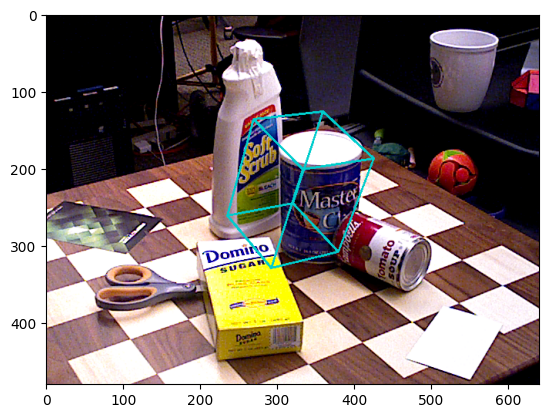

Pose estimation time: 5.170713663101196
R_est: [[-0.54244295 -0.80091435  0.25355839]
 [-0.58622256  0.14467718 -0.7971271 ]
 [ 0.60174642 -0.58103762 -0.54799318]]
t_est: [ 12.40061012 -14.11353706 980.3871256 ]
running k-means on cuda..


[running kmeans]: 3it [00:00, 24.15it/s, center_shift=0.000000, iteration=3, tol=0.000100]


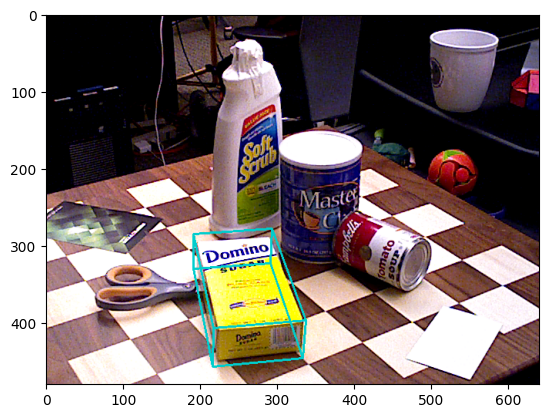

Pose estimation time: 1.5863771438598633
R_est: [[ 0.05583417  0.97650996 -0.20811257]
 [-0.8662654  -0.0562627  -0.49640585]
 [-0.49645423  0.20799712  0.84277541]]
t_est: [-46.74600409 101.95405633 909.47211669]
running k-means on cuda..


[running kmeans]: 1it [00:00, 49.98it/s, center_shift=0.000000, iteration=1, tol=0.000100]
d:\ACCA sem 5\Machine Vision\Project\New Code\Vision_Project\pose_utils\vis_utils.py:87: RuntimeWarning: invalid value encountered in cast
  pose = eDbox_flat.astype(np.uint16)


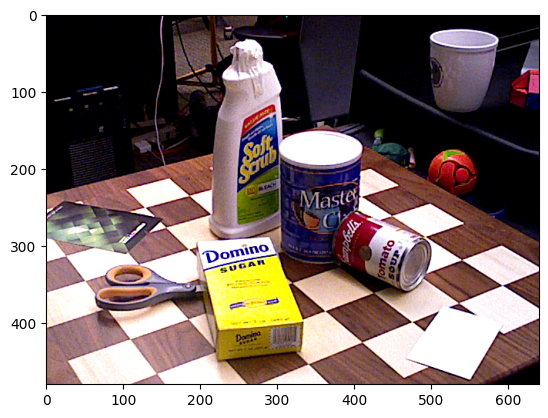

Pose estimation time: 1.3440492153167725
R_est: [[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
t_est: [0.00000000e+000 2.35701433e+184 3.80053174e+175]
running k-means on cuda..


[running kmeans]: 5it [00:00, 20.42it/s, center_shift=0.000000, iteration=5, tol=0.000100]


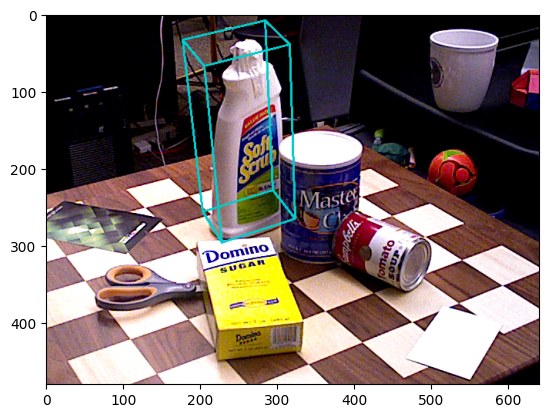

Pose estimation time: 5.704155445098877
R_est: [[ 0.90325113 -0.42825195 -0.02715985]
 [-0.28491006 -0.5511841  -0.7842336 ]
 [ 0.3208795   0.716098   -0.61987095]]
t_est: [-54.06670318 -78.34110227 999.84576803]
running k-means on cuda..


[running kmeans]: 3it [00:00, 61.28it/s, center_shift=0.000000, iteration=3, tol=0.000100]


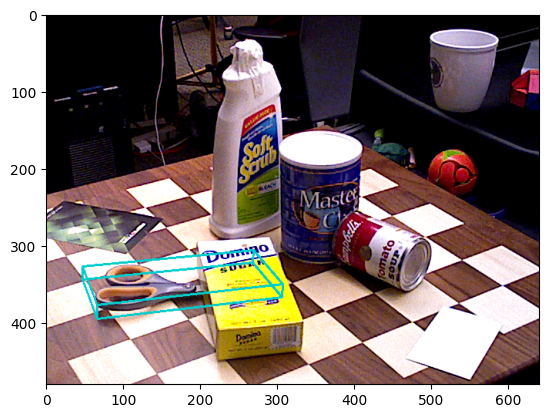

Pose estimation time: 6.311068058013916
R_est: [[ 0.36916975  0.92694827  0.0669372 ]
 [ 0.33292388 -0.06465874 -0.94073425]
 [-0.86768392  0.36957563 -0.33247327]]
t_est: [-116.03007488   90.42745674  907.84368783]


In [20]:
img_id = '000051_1'
# img_id = '8'



for i in range(len(data_gt[img_id])):
    obj_number = i
    obj_id = data_gt[img_id][obj_number]['obj_id']
    cam_K = np.array(data_gt[img_id][obj_number]['cam_K']).reshape((3,3))
    bbox = data_gt[img_id][obj_number]['bbox_visib']

    img_path = os.path.join(config['dataset_path'], data_gt[img_id][obj_number]['img_name'].split("./")[-1])
    img = Image.open(img_path)

    mask = data_gt[img_id][obj_number]['mask_sam']
    mask = img_utils.rle_to_mask(mask)
    mask = mask.astype(np.uint8)

    start_time = time.time()
    
    # To estimate the objects Rotation R and translation t the input image, the object_id, a segmentation mask and camera matrix are necessary
    R_est, t_est = pose_estimator.get_pose(img, str(obj_id), mask, cam_K, bbox=None)

    end_time = time.time()
    
    out_img = vis_utils.draw_3D_bbox_on_image(np.array(img), R_est, t_est, cam_K, data_gt[img_id][obj_number]['model_info'], factor=1.0)

    plt.imshow(out_img)
    plt.show()
    print(f"Pose estimation time: {end_time-start_time}")
    print(f"R_est: {R_est}")
    print(f"t_est: {t_est}")

running k-means on cuda..


[running kmeans]: 3it [00:00, 35.68it/s, center_shift=0.000000, iteration=3, tol=0.000100]

Pose estimation time: 1.679154634475708
R_est: [[-0.0499858   0.95278057  0.2995173 ]
 [-0.66651867  0.19151939 -0.72046734]
 [-0.74381065 -0.23564701  0.62547279]]
t_est: [ 20.60237986 -11.78085446 822.10259151]


running k-means on cuda..


[running kmeans]: 5it [00:00, 47.69it/s, center_shift=0.000000, iteration=5, tol=0.000100]

Pose estimation time: 1.3325941562652588
R_est: [[-0.6790138   0.73390322 -0.01806439]
 [ 0.44663534  0.39345202 -0.80356231]
 [-0.58262949 -0.55369809 -0.59494647]]
t_est: [149.31451378 -96.04065428 966.00120067]


running k-means on cuda..


[running kmeans]: 4it [00:00, 28.00it/s, center_shift=0.000000, iteration=4, tol=0.000100]


Pose estimation time: 1.4705116748809814
R_est: [[-0.83364301 -0.54831768 -0.06623485]
 [-0.33482159  0.59710497 -0.72894455]
 [ 0.43924234 -0.58550268 -0.68136098]]
t_est: [-73.07117573 -70.51110408 968.48924891]
running k-means on cuda..


[running kmeans]: 1it [00:00, 144.68it/s, center_shift=0.000000, iteration=1, tol=0.000100]

Pose estimation time: 1.5252761840820312
R_est: [[ 0.94368885  0.17086903 -0.28329335]
 [-0.25653143 -0.16278973 -0.95272826]
 [-0.208909    0.97175268 -0.10978957]]
t_est: [ 32.3147658   62.6060426  858.13487906]


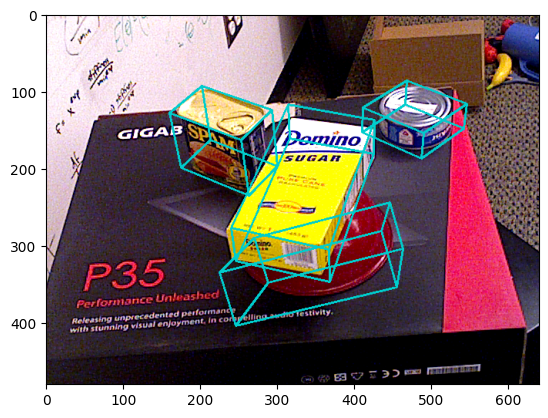

In [13]:
img_id = '000049_1'
# img_id = '8'

img_path = os.path.join(config['dataset_path'], data_gt[img_id][obj_number]['img_name'].split("./")[-1])
img = Image.open(img_path)

for i in range(len(data_gt[img_id])):
    obj_number = i
    obj_id = data_gt[img_id][obj_number]['obj_id']
    cam_K = np.array(data_gt[img_id][obj_number]['cam_K']).reshape((3,3))
    bbox = data_gt[img_id][obj_number]['bbox_visib']



    mask = data_gt[img_id][obj_number]['mask_sam']
    mask = img_utils.rle_to_mask(mask)
    mask = mask.astype(np.uint8)

    start_time = time.time()
    
    # To estimate the objects Rotation R and translation t the input image, the object_id, a segmentation mask and camera matrix are necessary
    R_est, t_est = pose_estimator.get_pose(img, str(obj_id), mask, cam_K, bbox=None)

    end_time = time.time()
    
    out_img = vis_utils.draw_3D_bbox_on_image(np.array(img), R_est, t_est, cam_K, data_gt[img_id][obj_number]['model_info'], factor=1.0)
    img = out_img
    print(f"Pose estimation time: {end_time-start_time}")
    print(f"R_est: {R_est}")
    print(f"t_est: {t_est}")
plt.imshow(out_img)
plt.show()
